# EDA

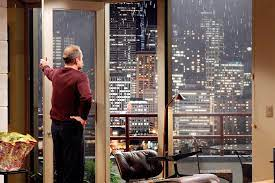

Analysis for Buyer:
Larry Sanders - Waterfront , limited budget, nice & isolated but central neighborhood without kids (but got some of his own, just doesn't want his kids to play with other kids .. because of germs)

In [1]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, date, time, timedelta
import plotly.express as px
import geopandas as gpd


#from matplotlib.ticker import PercentFormatter
#plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
#plt.rcParams["figure.facecolor"]= "w"
#pd.plotting.register_matplotlib_converters()
#pd.set_option('display.float_format', lambda x: '%.3f' % x)

## Preprocessing data

In [2]:
#data = pd.read_csv('data/eda.csv')
data = pd.read_csv('data/kc_houses.csv')

#Dropping annecessary columns
data = data.drop(['house_id','id'],axis = 1)
data = data.rename({'id.1':'id'},axis=1)
data.head()
#data.groupby('house_id').count().date.unique()

,date,price,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,2014-10-13,221900.0,7129300520,3.0,1.00,1180.0,5650.0,1.0,NaN,0.0,...,7,1180.0,0.0,1955,0.0,98178,47.5112,-122.257,1340.0,5650.0
1,2014-12-09,538000.0,6414100192,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,...,7,2170.0,400.0,1951,19910.0,98125,47.7210,-122.319,1690.0,7639.0
2,2015-02-25,180000.0,5631500400,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,...,6,770.0,0.0,1933,NaN,98028,47.7379,-122.233,2720.0,8062.0
3,2014-12-09,604000.0,2487200875,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,...,7,1050.0,910.0,1965,0.0,98136,47.5208,-122.393,1360.0,5000.0
4,2015-02-18,510000.0,1954400510,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,...,8,1680.0,0.0,1987,0.0,98074,47.6168,-122.045,1800.0,7503.0


### TO-DO: change column names

Column description
| Column name | Description |
| --- | ----------- |
| video_id | Unique identifier for each uploaded video|
| trending_date | Date on which this video was trending|
| title | Video title|
| channel_title | Name of YouTube channel |
| category_id  | Category video belongs to |
| publish_time| Date and time, video was published |
| tags| Tags used for this video|
| views | Number of views |
| likes | Number of likes |
| dislikes | Number of dislikes |
| comment_count | Number of comments |
| thumbnail link | Link to reduced-size versions of pictures or videos |
| comments_disabled | States, if comments were disabled or not |
| ratings_disabled | States, if ratings were disabled or not |
| video_error_or_removed | States, if there was an error or if video was removed |
| description | Description of video content |

In [3]:
data.info()
# Date columns seems not to be recognized as data.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           21597 non-null  object 
 1   price          21597 non-null  float64
 2   id             21597 non-null  int64  
 3   bedrooms       21597 non-null  float64
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  float64
 6   sqft_lot       21597 non-null  float64
 7   floors         21597 non-null  float64
 8   waterfront     19206 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  float64
 13  sqft_basement  21145 non-null  float64
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17749 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [4]:
#Converting dates.

#data['yr_built'] = pd.to_datetime(data['yr_built'], format='%Y').dt.year
#data['yr_renovated'] = pd.to_datetime(data['yr_renovated'], format='%Y').dt.year
data['date'] = pd.to_datetime(data['date'], format='%Y-%m-%d')

data['year_sold'] = data['date'].dt.year
data["month_sold"]=data['date'].dt.month
data["day_sold"]=data['date'].dt.day_name()

data['house_age'] = date.today().year - data['yr_built']
#data['house_age'].astype('int') 


# Rearrange columns
columns = ['id', 'date','year_sold','month_sold', 'day_sold','price','house_age','yr_renovated','condition','grade','bedrooms', 'bathrooms','sqft_living','sqft_lot','floors','waterfront',
        'view','sqft_above','sqft_basement','zipcode','lat','long','sqft_living15','sqft_lot15','yr_built']
data = data[columns]
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   year_sold      21597 non-null  int32         
 3   month_sold     21597 non-null  int32         
 4   day_sold       21597 non-null  object        
 5   price          21597 non-null  float64       
 6   house_age      21597 non-null  int64         
 7   yr_renovated   17749 non-null  float64       
 8   condition      21597 non-null  int64         
 9   grade          21597 non-null  int64         
 10  bedrooms       21597 non-null  float64       
 11  bathrooms      21597 non-null  float64       
 12  sqft_living    21597 non-null  float64       
 13  sqft_lot       21597 non-null  float64       
 14  floors         21597 non-null  float64       
 15  waterfront     1920

In [5]:
# Fill NaNs
data.isnull().sum()
# Nans present in yr_renovated, waterfront, view, sqft_basement
data.fillna(0,inplace = True)


In [6]:
data.isnull().sum()
# Year renovated has one 0 too much and should be adapted. However for this task year renovated is irrelevant, thus it will be left.
#data.yr_renovated = data.yr_renovated.astype('int')
#data['yr_renovated'].unique()

id               0
date             0
year_sold        0
month_sold       0
day_sold         0
price            0
house_age        0
yr_renovated     0
condition        0
grade            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
sqft_above       0
sqft_basement    0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
yr_built         0
dtype: int64

In [7]:
# Analyze duplicates
data.duplicated().value_counts()

# Houses sold multiple times.
data.yr_renovated = data.yr_renovated.apply(lambda x: x/10 if x>0  else x ).astype('int')

In [8]:
#data.yr_renovated = data.yr_renovated/1000
data.yr_renovated.unique()

array([   0, 1991, 2002, 2010, 1992, 2013, 1994, 1978, 2005, 2003, 1984,
       1954, 2014, 2011, 1983, 1945, 1990, 1988, 1977, 1981, 1995, 2000,
       1999, 1998, 1970, 1989, 2004, 1986, 2007, 1987, 2006, 1985, 2001,
       1980, 1971, 1979, 1997, 1950, 1969, 1948, 2009, 2015, 1974, 2008,
       1968, 2012, 1963, 1951, 1962, 1953, 1993, 1996, 1955, 1982, 1956,
       1940, 1976, 1946, 1975, 1964, 1973, 1957, 1959, 1960, 1967, 1965,
       1934, 1972, 1944, 1958])

In [9]:
#Enrich columns

# Space in m^2
data['space_m2'] = data.sqft_living/10.764
# price per squarefoot
data.eval('price_per_sqft = price / sqft_living ', inplace = True)
data.price_per_sqft = data.price_per_sqft.round(2)
# renovated as bool
data['renovated'] = data.yr_renovated.apply(lambda x: x if x==0 else 1).astype('category')
data['basement'] = data.sqft_basement.apply(lambda x: x if x==0 else 1)
data['viewed'] = data.view.apply(lambda x: x if x==0 else 1)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 30 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   id              21597 non-null  int64         
 1   date            21597 non-null  datetime64[ns]
 2   year_sold       21597 non-null  int32         
 3   month_sold      21597 non-null  int32         
 4   day_sold        21597 non-null  object        
 5   price           21597 non-null  float64       
 6   house_age       21597 non-null  int64         
 7   yr_renovated    21597 non-null  int64         
 8   condition       21597 non-null  int64         
 9   grade           21597 non-null  int64         
 10  bedrooms        21597 non-null  float64       
 11  bathrooms       21597 non-null  float64       
 12  sqft_living     21597 non-null  float64       
 13  sqft_lot        21597 non-null  float64       
 14  floors          21597 non-null  float64       
 15  wa

In [10]:
data[['id','price_per_sqft','price','sqft_living','yr_renovated']] 

,id,price_per_sqft,price,sqft_living,yr_renovated
0,7129300520,188.05,221900.0,1180.0,0
1,6414100192,209.34,538000.0,2570.0,1991
2,5631500400,233.77,180000.0,770.0,0
3,2487200875,308.16,604000.0,1960.0,0
4,1954400510,303.57,510000.0,1680.0,0
...,...,...,...,...,...
21592,263000018,235.29,360000.0,1530.0,0
21593,6600060120,173.16,400000.0,2310.0,0
21594,1523300141,394.22,402101.0,1020.0,0
21595,291310100,250.00,400000.0,1600.0,0


## Analyze data


### Generic analysis

In [11]:
#To-Do: Change size of marks.
fig = px.scatter_mapbox(data,
                        lat=data.lat,
                        lon=data.long,
                        hover_name="id",
                        hover_data = ['zipcode','price'],
                        zoom=9,width=900, height=700,
                        mapbox_style="open-street-map",
                        color = 'grade',
                        color_continuous_scale='rainbow_r')
fig.update_layout(title ='Apartment distribution ', title_x=0.5)
fig.show()

fig.write_html('pictures/Overview.html')

In [12]:
# Distribution of houses with price per squarefoot



#To-Do: Change size of marks.
fig = px.scatter_mapbox(data,
                        lat=data.lat,
                        lon=data.long,
                        hover_name="id",
                        hover_data = ['zipcode','price'],
                        zoom=9,width=900, height=700,
                        mapbox_style="open-street-map",
                        color = 'price_per_sqft',
                        color_continuous_scale='inferno_r')
fig.update_layout(title ='Price distribution',title_x=0.5)
fig.write_html('pictures/Overview_price.html')
fig.show()


In [13]:
#Centeral zipcodes
#zipcodes = df_temp.zipcode.unique()

# Tier 1 zip codes:
# Based on https://www.seattle.gov/documents/Departments/FAS/PurchasingAndContracting/Labor/CAI-Priority-Hire-2016.pdf
center = [98074,98075,98039,98004, 98103,98117,98115,98105,98134,98119,98199,98118,98104,98106,98144,98101,98122,98121,98107,98109,98102,98126,98108,98146,98134,98112,98040]
result = [True if x in center else False for x in data.zipcode]
df = data[result]



### Univariate analysis

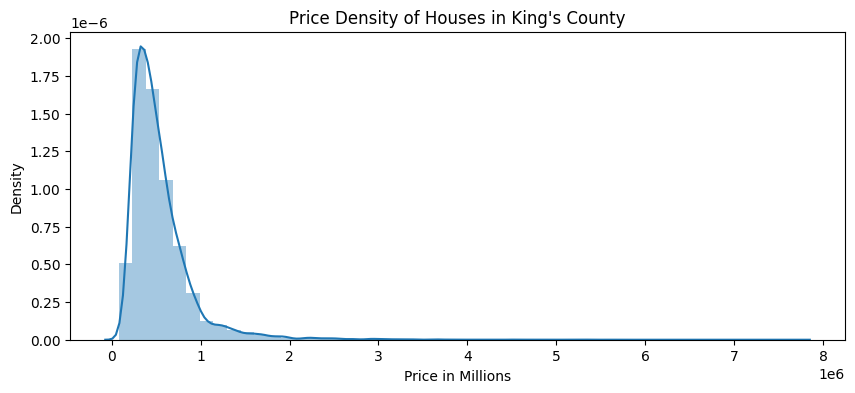

In [14]:
# Price
plt.figure(figsize=(10,4))

price_dist = sns.distplot(data["price"])
price_dist.set(xlabel="Price in Millions", title="Price Density of Houses in King's County")
plt.show()


In [15]:
# Selling activity

count = data.groupby('id').count()
df['count_sales'] = df.groupby('id').transform('size')
#df['count_sales'] = df['id'].map(df['id'].value_counts())

fig = px.scatter_mapbox(data,
                        lat=data.lat,
                        lon=data.long,
                        hover_name="id",
                        hover_data = ['zipcode','price'],
                        zoom=10,width=900, height=700,
                        mapbox_style="open-street-map",
                        color = 'view',
                        color_continuous_scale='hot_r')
fig.update_layout(title ='Number of views ')
fig.show()

# No real conclusion except that more views at waterfront.

[Text(0.5, 0, 'Number of Floors'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Frequency of House Purchases by Number of Floors')]

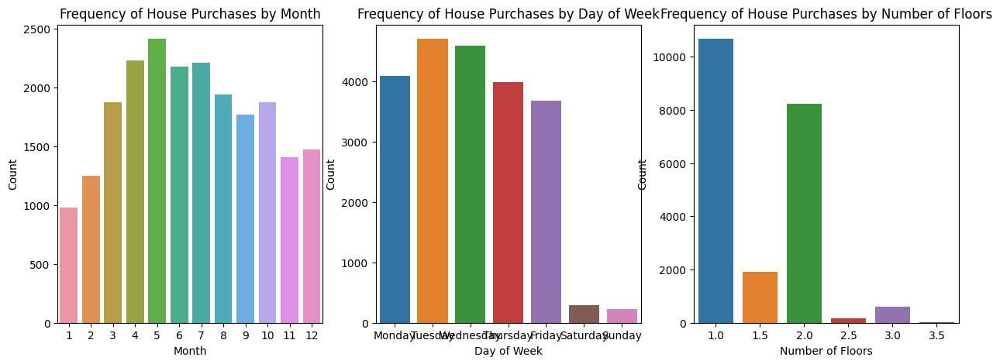

In [16]:
#By sellibg frequency
month_group = data.groupby(by=["month_sold"])
day_group = data.groupby(by=["day_sold"])

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# by month
month_freq = month_group.size()
sns.barplot(ax= axes[0],x=month_freq.index, y=month_freq.values)
axes[0].set(xlabel="Month", ylabel="Count", title="Frequency of House Purchases by Month")

#by day of week
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

day_freq = day_group.size()
sns.barplot(ax = axes[1],x=day_freq.index, y=day_freq.values,order=day_order)
axes[1].set(xlabel="Day of Week", ylabel="Count", title="Frequency of House Purchases by Day of Week")

# by number of floors

floor_group = data.groupby(by=["floors"])
floor_freq = floor_group.size()
sns.barplot(ax = axes[2], x=floor_freq.index, y=floor_freq.values)
axes[2].set(xlabel="Number of Floors", ylabel="Count", title="Frequency of House Purchases by Number of Floors")

# Coclusion: Selling better in Spring and Summer, best Tuesday and Wednesday, 
# 2 - 3 bathrooms, 3 - 4 bedrooms, 1 - 2 floors


<function matplotlib.pyplot.show(close=None, block=None)>

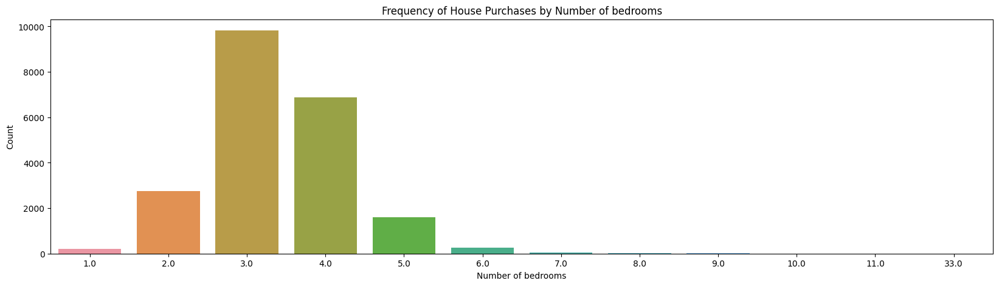

In [17]:
# by bedrooms
fig2=plt.figure(figsize=(20,5))
group2 = data.groupby(by=["bedrooms"])
group2_freq = group2.size()
fig2=sns.barplot( x=group2_freq.index, y=group2_freq.values)
fig2.set(xlabel="Number of bedrooms", ylabel="Count", title="Frequency of House Purchases by Number of bedrooms")
plt.show

[Text(0.5, 0, 'Number of bathrooms'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Frequency of House Purchases by Number of bathrooms')]

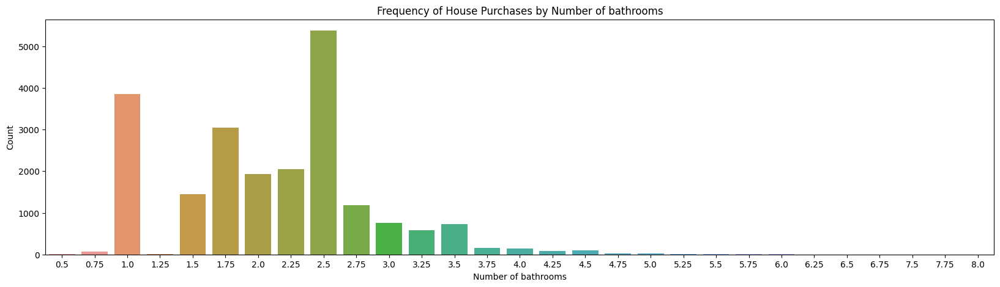

In [18]:
fig=plt.figure(figsize=(20,5))
group = data.groupby(by=['bathrooms'])
group_freq = group.size()
fig=sns.barplot(x=group_freq.index, y=group_freq.values)
fig.set(xlabel="Number of bathrooms", ylabel="Count", title="Frequency of House Purchases by Number of bathrooms")

In [19]:
# Age distribution
fig = px.scatter_mapbox(df,
                        lat=df.lat,
                        lon=df.long,
                        hover_name="id",
                        hover_data = ['zipcode','price'],
                        zoom=10,width=900, height=700,
                        mapbox_style="open-street-map",
                        color = 'house_age',
                        color_continuous_scale='inferno')
fig.update_layout(title ='House age distribution',title_x = 0.5)
fig.show()

#fig.write_html('pictures/Age_center.html')


# Conclusion: Youngest in the center. Also Bellevue coast and Sammamisch seem good.

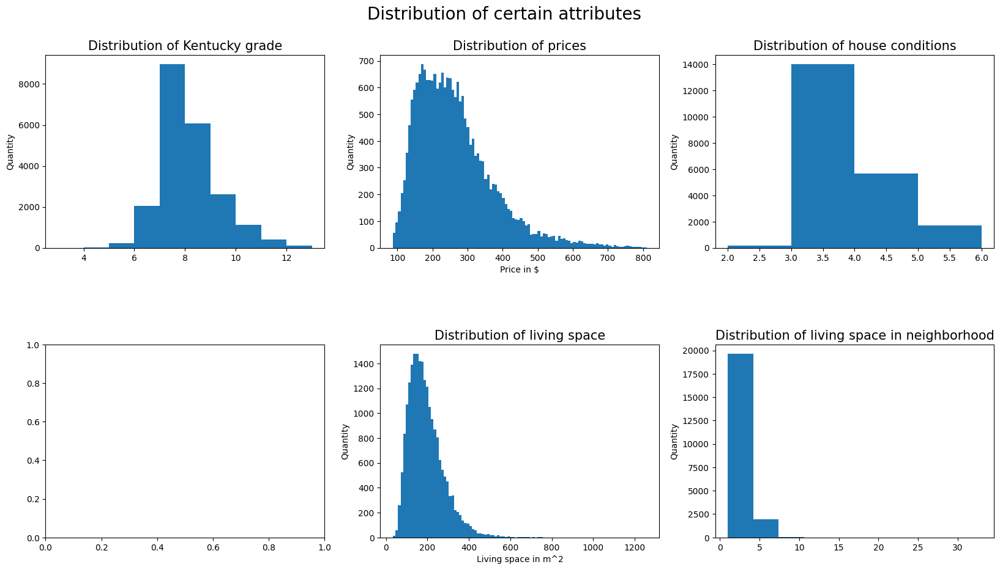

In [20]:
# Looking at distributions
fig, ax = plt.subplots(2,3, figsize=(20,10)) # create subplots on 2 rows and 3 columns
plt.suptitle('Distribution of certain attributes', fontsize=20)
plt.subplots_adjust(hspace = .5, wspace = .2, top = .9) # adjusts the space between the single subplots

ax[0][0].hist(x=data['grade'])
ax[0][0].set_ylabel("Quantity", fontsize = 10)
ax[0][0].set_title("Distribution of Kentucky grade", fontsize = 15);

ax[0][2].hist(x= data['condition'], bins = [2,3,4,5,6] )
ax[0][2].set_ylabel("Quantity", fontsize = 10)
ax[0][2].set_title("Distribution of house conditions", fontsize = 15);


ax[0][1].hist(x=data['price_per_sqft'],bins=100)
ax[0][1].set_ylabel("Quantity")
ax[0][1].set_xlabel("Price in $")
ax[0][1].set_title("Distribution of prices", fontsize = 15);

ax[1][1].hist(x=data['space_m2'], bins=100)
ax[1][1].set_ylabel("Quantity", fontsize = 10)
ax[1][1].set_xlabel("Living space in m^2")
ax[1][1].set_title("Distribution of living space", fontsize = 15);
                           
ax[1][2].hist(x=data['bedrooms'])
ax[1][2].set_ylabel("Quantity", fontsize = 10)
ax[1][2].set_title("Distribution of living space in neighborhood", fontsize = 15);

fig;

In [21]:
'''feat_con = df[['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15', 'yr_built', 'yr_renovated', 'lat', 'long']]
col_con = feat_con.columns
feat_cat = df[['view', 'condition', 'grade', 'waterfront', 'floors', 'bedrooms', 'bathrooms', 'zipcode']]
col_cat = feat_cat.columns

## Display distribution plots of continuous variables using FacetGrid and distplot

con_1 = pd.melt(df, value_vars = col_con)
g = sns.FacetGrid(con_1, col='variable', col_wrap=3, sharex=False, sharey=False, height=4)
g = g.map(sns.distplot, 'value', color='r')
g.set_xticklabels(rotation=45)'''


"feat_con = df[['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15', 'yr_built', 'yr_renovated', 'lat', 'long']]\ncol_con = feat_con.columns\nfeat_cat = df[['view', 'condition', 'grade', 'waterfront', 'floors', 'bedrooms', 'bathrooms', 'zipcode']]\ncol_cat = feat_cat.columns\n\n## Display distribution plots of continuous variables using FacetGrid and distplot\n\ncon_1 = pd.melt(df, value_vars = col_con)\ng = sns.FacetGrid(con_1, col='variable', col_wrap=3, sharex=False, sharey=False, height=4)\ng = g.map(sns.distplot, 'value', color='r')\ng.set_xticklabels(rotation=45)"

### Multivariate analysis

[Text(0.5, 0, 'Age category'),
 Text(0, 0.5, 'Price/Squartfoot'),
 Text(0.5, 1.0, 'Price vs. Age category')]

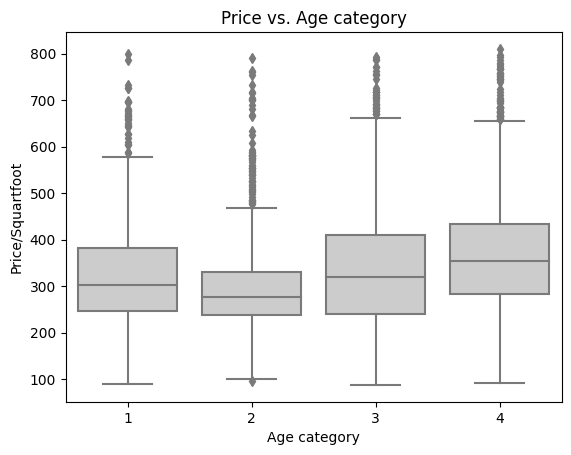

In [22]:
#Influence on Price
def house_category(x):
    if x<=25:
        return 1
    elif x<=50:
        return 2
    elif x<=75:
        return 3
    else:
        return 4
        
df['age_category'] = df.house_age.apply(house_category)

#df.sort_values('price',ascending = False).head()

columns = ['grade','house_age','zipcode','condition','sqft_living','sqft_living15','price_per_sqft','waterfront','bedrooms','bathrooms','sqft_lot','sqft_lot15','renovated','price']

fig2 = sns.boxplot(data = df, x = 'age_category',y='price_per_sqft',color=".8")
fig2.set(xlabel ="Age category", ylabel = "Price/Squartfoot", title ='Price vs. Age category')

# No real conclusion by age category.

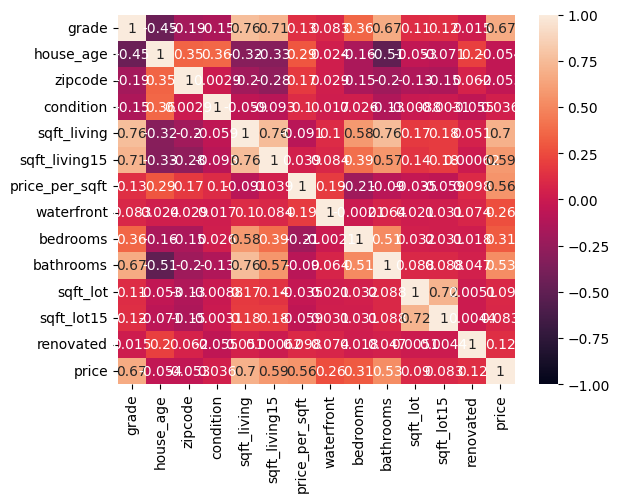

In [23]:

corr_matrix = data[columns].corr( method = 'pearson')
heatmap= sns.heatmap(corr_matrix,vmin=-1, vmax=1, annot=True)

#Conclusion: 
# Price is correlated with sqft_living and Kentucky grade
# Grade correlated with sqft_living

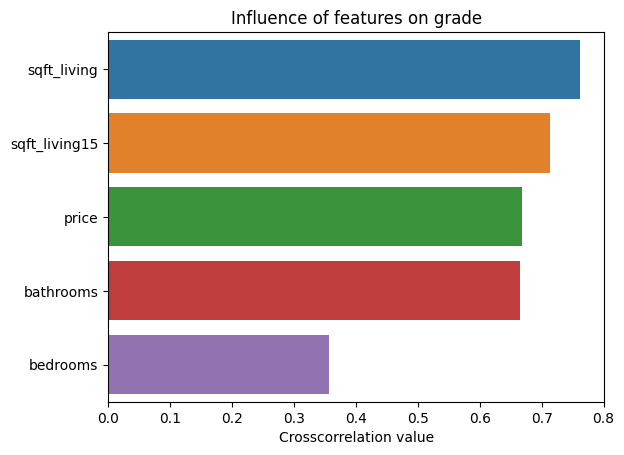

In [24]:
corr_matrix.sort_values(by='grade',ascending=False,inplace=True)
plt.figure()
fig_corr = sns.barplot(y = corr_matrix.index[1:6], x = corr_matrix.grade[1:6], errorbar = None )
plt.title('Influence of features on grade')
plt.xlabel('Crosscorrelation value')
#fig_corr = plt.bar(corr_matrix.grade, height = )
plt.savefig('pictures/Corr_grade.png')

# Conclusion: sqft_living, price and number of bathrooms have the biggest influence on grade.

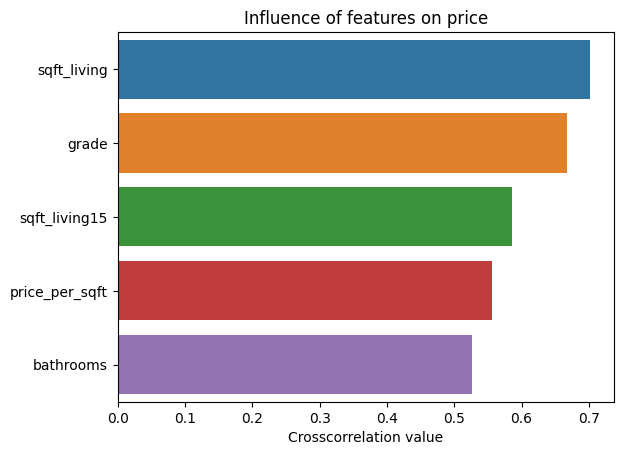

In [25]:
corr_matrix.sort_values(by='price',ascending=False,inplace=True)
plt.figure()
fig_corr = sns.barplot(y = corr_matrix.index[1:6], x = corr_matrix.price[1:6], errorbar = None )
plt.title('Influence of features on price')
plt.xlabel('Crosscorrelation value')
#fig_corr = plt.bar(corr_matrix.grade, height = )
plt.savefig('pictures/Corr_price.png')

# Conclusion: sqft_living, grade and number of bathrooms have the biggest influence on price.

In [26]:
# It doesn't make sense to calculate correlation with categorical values like zipcode with this function. 
# TO-Do not clear how to calculate correlation between zipcode and price.

### Customer specific filtering

In [27]:
# Waterfront wanted

df_w = data.query('waterfront == 1')
df_w.shape

df_w[['price','house_age','grade','condition']].describe()

# Conclusion: All houses seem to have a good grade.

,price,house_age,grade,condition
count,1.460000e+02,146.000000,146.000000,146.000000
mean,1.717215e+06,60.719178,8.835616,3.541096
std,1.145385e+06,27.118576,1.781233,0.743957
min,2.850000e+05,9.000000,5.000000,1.000000
25%,8.275000e+05,38.250000,8.000000,3.000000
50%,1.510000e+06,63.500000,9.000000,3.000000
75%,2.282500e+06,81.750000,10.000000,4.000000
max,7.060000e+06,118.000000,12.000000,5.000000


In [28]:

fig = px.scatter_mapbox(df_w,
                        lat=df_w.lat,
                        lon=df_w.long,
                        hover_name="id",
                        hover_data = ['zipcode','price'],
                        zoom=10,width=900, height=700,
                        mapbox_style="open-street-map",
                        color = 'grade',
                        color_continuous_scale='rainbow_r')
fig.update_layout(title ='Grade distribution center ', title_x = 0.5)
fig.show()

fig.write_html('pictures/Houses_water.html')

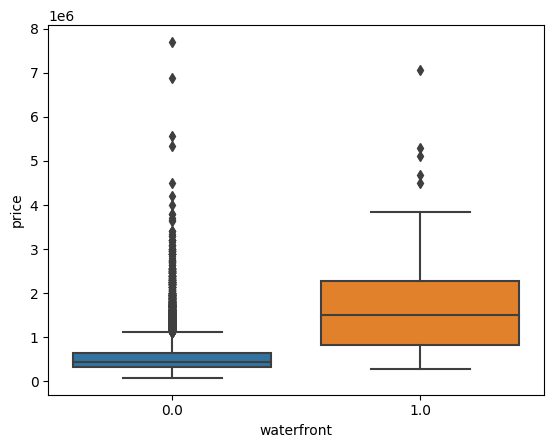

In [29]:
fig = sns.boxplot(data = data, x = 'waterfront',y='price')
plt.savefig('pictures/Water_price_outliers.png')

# Conclusion: Everything above 4 million seems like outliers.

In [30]:
# Renovated
#fig_ren = sns.histplot(data=df_w, x="renovated", shrink=.5)
#df_w.sort_values(by = 'yr_renovated', ascending = False, inplace = True)
#px.scatter(df_w, x="house_age", y="yr_renovated",hover_data = 'id',range_y = [1980,2020], color ='grade',color_continuous_scale='rainbow_r' )
fig = px.scatter(df_w, x="house_age", y="yr_renovated",hover_data = 'id', color ='grade',color_continuous_scale='hot_r' )
fig.update_layout(title ='Age and renovation state', title_x = 0.5)
fig.show()

fig.write_html('pictures/Houses_water_age.html')

# Conclusion: Only houses above 40 renovated.

In [31]:
df_wf = df_w.query('(house_age < 60 | yr_renovated > 2000) &  (grade >9 ) & (bedrooms >= 3)')
result = [True if x in center else False for x in df_wf.zipcode]
#df_wfc = df_wf[result]

fig = px.scatter_mapbox(df_wf,
                        lat=df_wf.lat,
                        lon=df_wf.long,
                        hover_name="id",
                        hover_data = ['zipcode','price','bedrooms','sqft_living15'],
                        zoom=10,width=900, height=700,
                        mapbox_style="open-street-map",
                        color = 'bathrooms',
                        color_continuous_scale='hot_r',
                        size = 'sqft_living')
fig.update_layout(title ='Grade distribution center ')
fig.show()
df_wf.shape



(45, 30)

## Recommendation
Assumptions:
- waterfront
- center
- house age < 60 or renovated after 2000
- grade > 9
- bedrooms > = 3

Recommendation criteria becaue of reselling probability.
- Price < 4 000 000
- 2 - 3 bathrooms
- 3 - 4 bedrooms
- 1 - 2 floors


In [35]:
 #24 rows
#fig = px.scatter(df_wf, x="price_per_sqft", y="sqft_living",hover_data = 'id', color ='sqft_living15',color_continuous_scale='hot_r' )
df_wfc = df_wf.sort_values(by='sqft_living',ascending = False)
#df_wfc[['id','date','price','bathrooms','sqft_living','sqft_living15','bedrooms']]
df_size = df_wfc[0:10]
df_size = df_size.sort_values(by='price',ascending = False)

#df_wf.sort_values(by='date',ascending = False)['date']
#px.scatter(df_wf, x="id", y="date",hover_data = 'id', color ='sqft_living15',color_continuous_scale='hot_r' )
#df_wfc.shape
#fig.show()
df_rec = df_size.query('id == 1924059029 | id == 7738500731 | id == 7558700030 ')
fig = px.scatter_mapbox(df_size[5:],
                        lat=df_size[5:].lat,
                        lon=df_size[5:].long,
                        hover_name="id",
                        hover_data = ['zipcode','price','bedrooms','sqft_living15','house_age','grade','condition'],
                        zoom=10,width=900, height=700,
                        mapbox_style="open-street-map",
                        color = 'condition',
                        color_continuous_scale='bluered_r',
                        size = 'bathrooms',
                        labels = 'id')
fig.update_layout(title ='Recommendation ',title_x = 0.5)
fig.show()

fig.write_html('pictures/Recommendation.html')

df_size[['id','zipcode','date','price','bathrooms','bedrooms','floors','sqft_living','sqft_living15','house_age','yr_renovated','condition','sqft_lot']].head(10)

,id,zipcode,date,price,bathrooms,bedrooms,floors,sqft_living,sqft_living15,house_age,yr_renovated,condition,sqft_lot
3910,9808700762,98004,2014-06-11,7060000.0,4.50,5.0,2.0,10040.0,3930.0,83,2001,3,37325.0
1313,7558700030,98040,2015-04-13,5300000.0,6.00,6.0,2.0,7390.0,4320.0,32,0,4,24829.0
1162,1247600105,98033,2014-10-20,5110000.0,5.25,5.0,2.0,8010.0,3430.0,24,0,3,45517.0
8085,1924059029,98040,2014-06-17,4670000.0,6.75,5.0,1.0,9640.0,3270.0,40,2009,3,13068.0
2624,7738500731,98155,2014-08-15,4500000.0,5.50,5.0,2.0,6640.0,3030.0,19,0,3,40014.0
2083,8106100105,98040,2014-11-14,3850000.0,4.25,4.0,2.0,5770.0,4620.0,43,0,4,21300.0
14070,3625059043,98008,2014-09-04,3300000.0,4.75,5.0,2.0,6200.0,2940.0,34,0,4,13873.0
15468,624069108,98075,2014-08-12,3200000.0,3.25,4.0,1.0,7000.0,4913.0,32,0,4,28206.0
17544,7631800015,98166,2015-04-07,2510000.0,3.25,3.0,2.0,5480.0,2500.0,32,0,3,57990.0
6227,2024069008,98027,2014-06-19,2200000.0,4.75,5.0,2.0,5990.0,3330.0,21,0,3,10450.0


In [34]:
fig = px.scatter(df_size, x="price", y="sqft_living",hover_data = ['id','bedrooms','grade','sqft_lot','condition','house_age','sqft_living15'], size = 'bathrooms', color ='condition',color_continuous_scale='hot_r' )
fig.update_layout(title ='Price vs Surface', title_x = 0.5)
fig.show()

#fig.write_html('pictures/Houses_water_price_surface.html')

# Conclusion: Everything bellow 4million seems good. 
# 8106 seems like a goof choice base on size of neighboars and its position close to the highway.
# 2024 couls also be a good choice. Is a young house.

In [ ]:
# Final decision support
# Price < value
# Grade > value
# Age > value
# Surface > value